In [2]:
%matplotlib inline
import sys
import numpy as np
import matplotlib.pyplot as pl

sys.path.append('..')
import vinify as vn

In [3]:
from glob import glob
file_list = glob('../sample/tpf/*.h5')
file_list.sort()
len(file_list)

84

In [4]:
file_list

['../sample/tpf/tess_100019999_7_2_1.h5',
 '../sample/tpf/tess_100129999_2_2_2.h5',
 '../sample/tpf/tess_100129999_3_2_1.h5',
 '../sample/tpf/tess_101069999_3_3_1.h5',
 '../sample/tpf/tess_101069999_4_3_2.h5',
 '../sample/tpf/tess_101169999_9_1_1.h5',
 '../sample/tpf/tess_101279999_9_1_1.h5',
 '../sample/tpf/tess_102119999_9_2_2.h5',
 '../sample/tpf/tess_10569999_7_1_1.h5',
 '../sample/tpf/tess_105799999_9_2_2.h5',
 '../sample/tpf/tess_1099999_4_1_1.h5',
 '../sample/tpf/tess_110339999_7_2_2.h5',
 '../sample/tpf/tess_113389999_7_3_1.h5',
 '../sample/tpf/tess_11519999_3_1_1.h5',
 '../sample/tpf/tess_115379999_3_2_1.h5',
 '../sample/tpf/tess_11569999_3_2_4.h5',
 '../sample/tpf/tess_118159999_8_2_4.h5',
 '../sample/tpf/tess_118549999_8_3_4.h5',
 '../sample/tpf/tess_118549999_9_3_4.h5',
 '../sample/tpf/tess_11899999_6_1_1.h5',
 '../sample/tpf/tess_120619999_6_2_3.h5',
 '../sample/tpf/tess_120959999_4_2_2.h5',
 '../sample/tpf/tess_120959999_4_2_3.h5',
 '../sample/tpf/tess_121049999_4_2_3.h5'

In [10]:
file_list

['../sample/tpf/tess_100019999_7_2_1.h5',
 '../sample/tpf/tess_100129999_2_2_2.h5',
 '../sample/tpf/tess_100129999_3_2_1.h5',
 '../sample/tpf/tess_101069999_3_3_1.h5',
 '../sample/tpf/tess_101069999_4_3_2.h5',
 '../sample/tpf/tess_101169999_9_1_1.h5',
 '../sample/tpf/tess_101279999_9_1_1.h5',
 '../sample/tpf/tess_102119999_9_2_2.h5',
 '../sample/tpf/tess_10569999_7_1_1.h5',
 '../sample/tpf/tess_105799999_9_2_2.h5',
 '../sample/tpf/tess_1099999_4_1_1.h5',
 '../sample/tpf/tess_110339999_7_2_2.h5',
 '../sample/tpf/tess_113389999_7_3_1.h5',
 '../sample/tpf/tess_11519999_3_1_1.h5',
 '../sample/tpf/tess_115379999_3_2_1.h5',
 '../sample/tpf/tess_11569999_3_2_4.h5',
 '../sample/tpf/tess_118159999_8_2_4.h5',
 '../sample/tpf/tess_118549999_8_3_4.h5',
 '../sample/tpf/tess_118549999_9_3_4.h5',
 '../sample/tpf/tess_11899999_6_1_1.h5',
 '../sample/tpf/tess_120619999_6_2_3.h5',
 '../sample/tpf/tess_120959999_4_2_2.h5',
 '../sample/tpf/tess_120959999_4_2_3.h5',
 '../sample/tpf/tess_121049999_4_2_3.h5'

../vinify.py:23: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  cx = f["header"]["cx"].value
../vinify.py:24: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  cy = f["header"]["cy"].value
../vinify.py:25: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  Tmag = f["header"]["Tmag"].value
/home/jp/miniconda3/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:17: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.


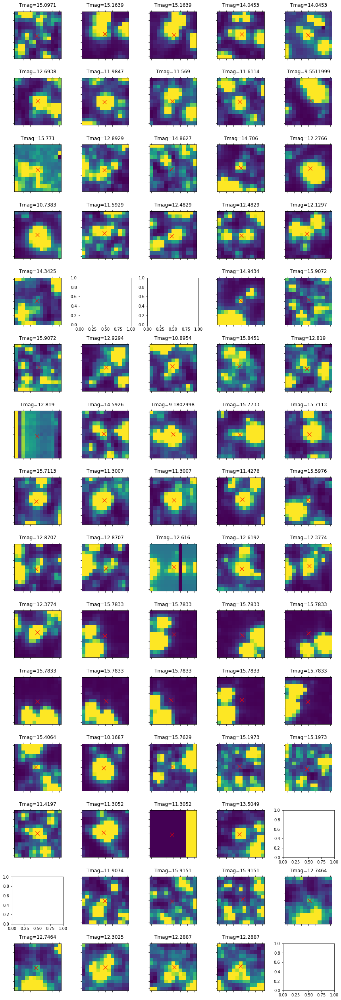

In [12]:
fig, axs = pl.subplots(15, 5, figsize=(12,35))
ax = axs.flatten()

for n,fp in enumerate(file_list[:-10]):
    with vn.h5py.File(fp, "r") as f:
        # load data
        time, flux, quality, my_quality, cx, cy, Tmag = vn.load_data(f)
        height, width = flux.shape[1:]
        try:
#             assert height==width==13
            # get a median image from the time-series image data
            img = np.nanmedian(flux, axis=0)
            zmin, zmax = interval.get_limits(img)
            ax[n].matshow(img, vmin=zmin, vmax=zmax)
            ax[n].plot(cx, cy, 'rx', ms=10)
#             ax[n].axis('off')
            tmag = f["header"]["Tmag"].value
            ax[n].set_title(f"Tmag={tmag}")
            ax[n].set_xticklabels('')
            ax[n].set_yticklabels('')
        except:
            pass
fig.tight_layout()

In [13]:
h5path = '../sample/tpf/tess_150189999_6_4_1.h5'
with vn.h5py.File(h5path, "r") as f:
    # load data
    time, flux, quality, my_quality, cx, cy, Tmag = vn.load_data(f)
    height, width = flux.shape[1:]
    assert height==width==13

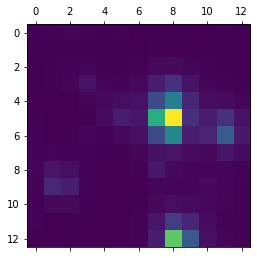

In [14]:
# get a median image from the time-series image data
img = np.nanmedian(flux, axis=0)
pl.matshow(img)

In [15]:
img.shape

(13, 13)

In [16]:
%%capture

#create an animation of images throughout the observation
from matplotlib import animation
from IPython.display import HTML
from astropy.visualization import ZScaleInterval
pl.rcParams["animation.html"] = "jshtml"

interval = ZScaleInterval(contrast=0.6)
fig = pl.figure()

zmin,zmax = interval.get_limits(flux[0])
ax = pl.imshow(img, vmin=zmin, vmax=zmax, animated=True)

def updatefig(n):
    ax.set_array(flux[n])
    return ax,

ani = animation.FuncAnimation(fig, updatefig, frames=flux.shape[0],
                              interval=10, blit=True)

In [17]:
ani

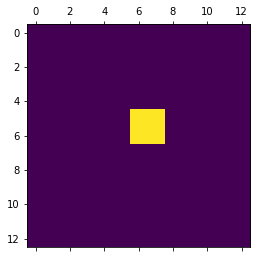

In [18]:
# calculate the max number of pixel used for aperture
area_thresh = vn.determine_area_thresh(Tmag)

# determine pixels for aperture
aperture = vn.determin_aperture(img, (cx, cy), area_thresh=area_thresh)
pl.matshow(aperture)

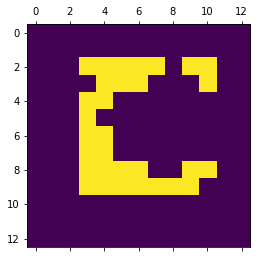

In [19]:
# determine pixels for background
bkg_aperture = vn.make_background(img, (cx, cy), aperture)
pl.matshow(bkg_aperture)

In [20]:
# create time-series iamge data containing only background pixels
bkg_frame = np.where(bkg_aperture == 1, flux, np.nan)
bkg_frame.shape

(993, 13, 13)

In [21]:
%%capture

#create an animation of images throughout the observation
from matplotlib import animation
from IPython.display import HTML

pl.rcParams["animation.html"] = "jshtml"

fig = pl.figure()
im = pl.imshow(bkg_frame[0], animated=True)

def updatefig(n):
    im.set_array(bkg_frame[n])
    return im,

ani = animation.FuncAnimation(fig, updatefig, frames=bkg_frame.shape[0],
                              interval=10, blit=True)

In [22]:
ani

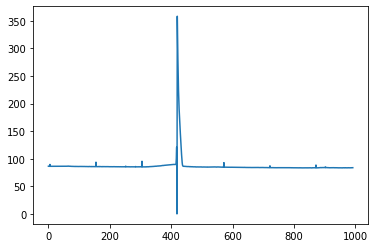

In [23]:
# take the average
bkg_arr = np.nanmean(bkg_frame, axis=(1, 2))
pl.plot(bkg_arr)

In [24]:
calibrated_flux = flux - bkg_arr.reshape((bkg_arr.shape[0], 1, 1))
calibrated_flux.shape

(993, 13, 13)

In [30]:
len(sap_flux), len(quality), len(time)

(993, 993, 993)

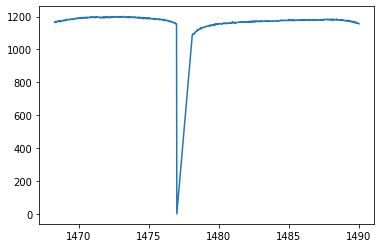

In [32]:
# create the light curve
aperture_frame = np.where(aperture == 1, calibrated_flux, 0)
sap_flux = np.sum(aperture_frame, axis=(1, 2))

flag = quality==32 #momentum dump
pl.plot(time[~flag], sap_flux[~flag])